# Data Exploration 

This notebook explores the dataset used for the Super Resolution / Decompression task.

### Dataset Structure
- **Original High-Res Images:** `data/raw` (Source: DIV2K)
- **Degraded Images:** `data/processed` (Generated via degradation script)

The goal is to verify that image pairs match correctly and visualize the patch extraction strategy used for training.

In [29]:
import os

# Define paths
ROOT = os.getcwd()
if os.path.basename(ROOT) == "notebooks":
    ROOT = os.path.dirname(ROOT)

processed_image_path = os.path.join(ROOT, "data", "processed")
raw_image_path = os.path.join(ROOT, "data", "raw")
model_path = os.path.join(ROOT, "models", "moj_model.pth")

files = sorted([f for f in os.listdir(raw_image_path)if f.lower().endswith((".jpg", ".png"))])

In [4]:
import os
import random

# Select random samples for verification
random.seed(10)
selected_files = random.sample(files, 2)

print(f"Total files found: {len(files)}")
print("=" * 22)

for filename in selected_files:
    file_stem = os.path.splitext(filename)[0]
    
    # Try to find matching file in processed directory
    # Assuming the processed file starts with the same name
    candidates = [f for f in os.listdir(processed_image_path) if f.startswith(file_stem)]
    
    if candidates:
        match = candidates[0]
        print(f"Original:  {filename}")
        print(f"Processed: {match}")
        print("-" * 22)
    else:
        print(f"No match found for {filename}!")



Total files found: 10
Original:  0010.png
Processed: 0010.png
----------------------
Original:  0001.png
Processed: 0001.png
----------------------


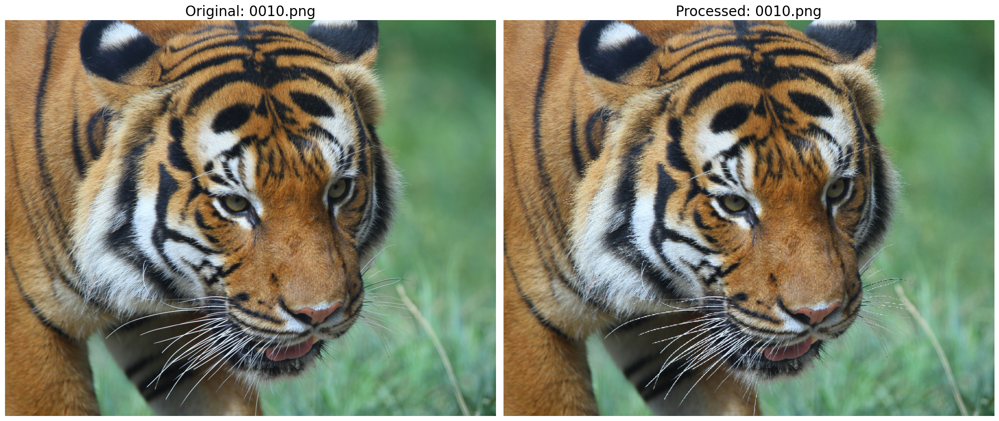

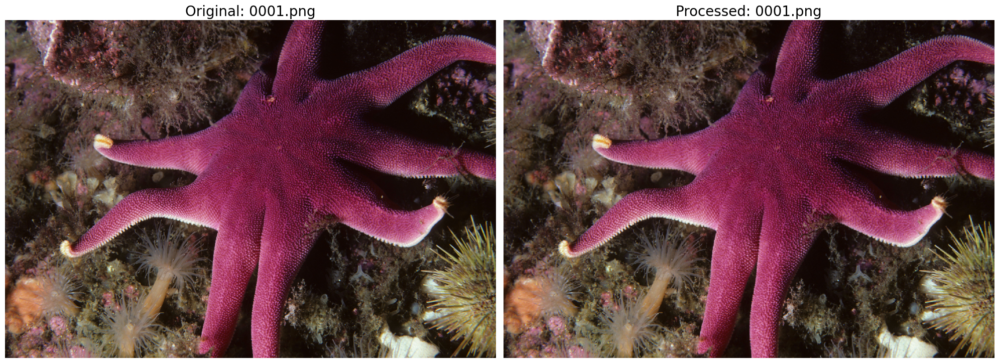

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline

for file in selected_files:

    file_stem = os.path.splitext(file)[0]
    candidates = [f for f in os.listdir(processed_image_path) if f.startswith(file_stem)]    
    processed_file = candidates[0]
    
    try:
        img_A = mpimg.imread(os.path.join(raw_image_path, file))
        img_B = mpimg.imread(os.path.join(processed_image_path, processed_file))
    except Exception as e:
        print(f"Error while loading images: {e}")
        continue

    fig, ax = plt.subplots(1, 2, figsize=(20, 10)) 
    
    ax[0].imshow(img_A)
    ax[0].set_title(f'Original: {file}', fontsize=20)
    ax[0].axis('off') 
    
    ax[1].imshow(img_B)
    ax[1].set_title(f'Processed: {processed_file}', fontsize=20)
    ax[1].axis('off')

    plt.tight_layout()
    plt.show()

## Patch Extraction Strategy

Since input images vary in dimensions but the neural network requires fixed-size inputs (256x256), we process images in patches.

**Handling Edge Cases:**
Instead of padding the image with zeros, we ensure complete coverage by shifting the last patch. This results in a slight overlap for the final patches in each row/column, ensuring no data is lost.

In [7]:
from PIL import Image

def visualize_patches(file, path, PATCH_SIZE=256, STRIDE=256):
    """
    Extracts and visualizes patches from an image to demonstrate the patching strategy.
    Implements overlap handling for edge cases.
    """

    path = os.path.join(path, file)
    img = Image.open(path)
    w, h = img.size
    print(f"Image: {file}, size: {w}x{h}")

    patches = []
    coords = []

    for y in range(0, h, STRIDE):
        for x in range(0, w, STRIDE):

            # Overlap handling
            x_start = min(x, w - PATCH_SIZE)
            y_start = min(y, h - PATCH_SIZE)

            patch = img.crop((x_start, y_start, x_start + PATCH_SIZE, y_start + PATCH_SIZE))
            patches.append(patch)
            coords.append((x_start, y_start))

    # Visualize patches
    cols = min(len(patches), w // STRIDE + 1)
    rows = (len(patches) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols*1.1, rows*1.1))

    for i, ax in enumerate(axes.flat):
        if i < len(patches):
            ax.imshow(patches[i])
            ax.set_title(f"{coords[i]}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


Image: 0010.png, size: 2040x1644


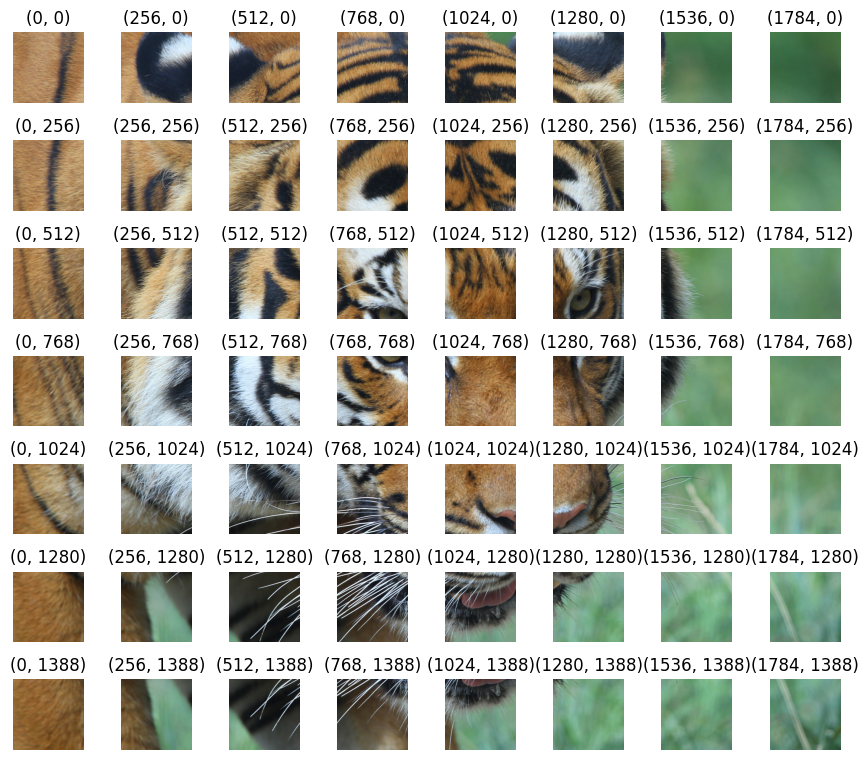

Image: 0001.png, size: 2040x1404


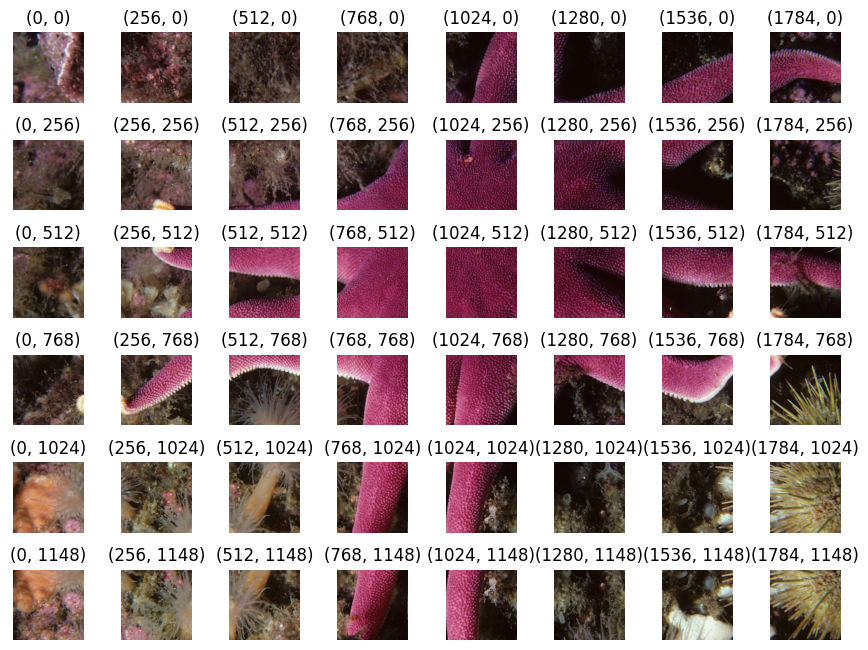

In [8]:
for file in selected_files:
    visualize_patches(file, raw_image_path)

In [ ]:
def extract_patches(file, path, patch_size=256, stride=256):
    """Returns list of patches (PIL.Image) and their coordinates for a given image file."""

    path = os.path.join(path, file)
    img = Image.open(path)
    w, h = img.size
    
    patches, coords = [], []

    for y in range(0, h, stride):
        for x in range(0, w, stride):
            x_start = min(x, w - patch_size)
            y_start = min(y, h - patch_size)

            patch = img.crop((x_start, y_start, x_start + patch_size, y_start + patch_size))
            patches.append(patch)
            coords.append((x_start, y_start))

    return patches, coords

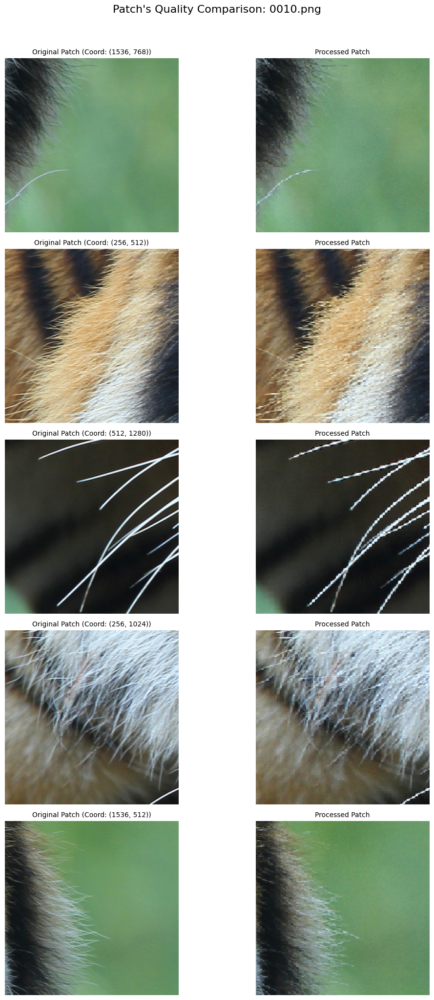

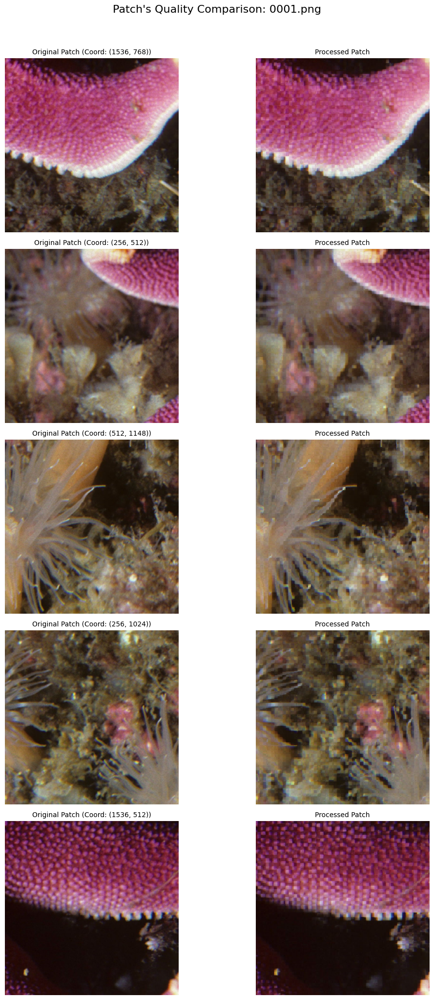

In [23]:
# Number of patches to compare per image
SAMPLES_PER_IMAGE = 5

for filename in selected_files:
    file_stem = os.path.splitext(filename)[0]
    candidates = [f for f in os.listdir(processed_image_path) if f.startswith(file_stem)]
    processed_filename = candidates[0]

    patches_raw, coords = extract_patches(filename, raw_image_path)
    patches_processed, _ = extract_patches(processed_filename, processed_image_path)
    

    random.seed(len(filename) + 4) 
    random_indices = random.sample(range(len(patches_raw)), min(len(patches_raw), SAMPLES_PER_IMAGE))

    fig, axes = plt.subplots(SAMPLES_PER_IMAGE, 2, figsize=(12, SAMPLES_PER_IMAGE * 4))
    fig.suptitle(f"Patch's Quality Comparison: {filename}", fontsize=16, y=1.02)

    for i, idx in enumerate(random_indices):
        axes[i, 0].imshow(patches_raw[idx])
        axes[i, 0].set_title(f"Original Patch (Coord: {coords[idx]})", fontsize=10)
        axes[i, 0].axis("off")
        
        axes[i, 1].imshow(patches_processed[idx])
        axes[i, 1].set_title(f"Processed Patch", fontsize=10)
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()